# Tutorial on Image Processing for EXTS

Why is image processing important ?
Use case in medicine

Quickly look at all patient's tissues

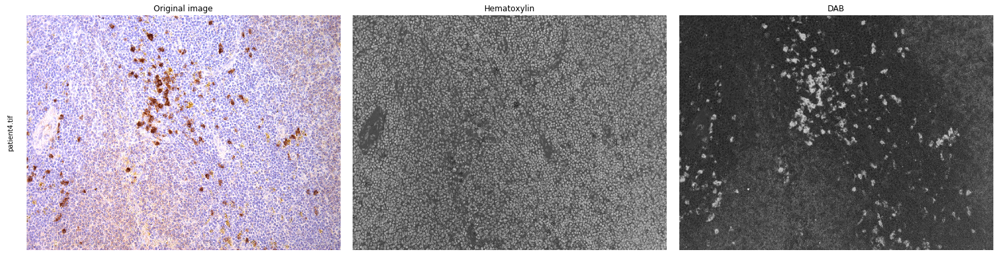

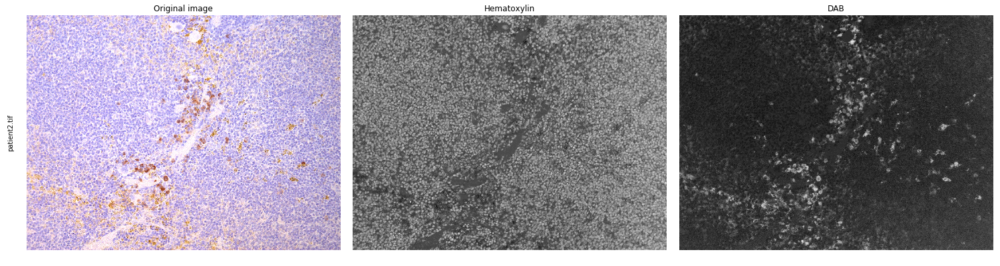

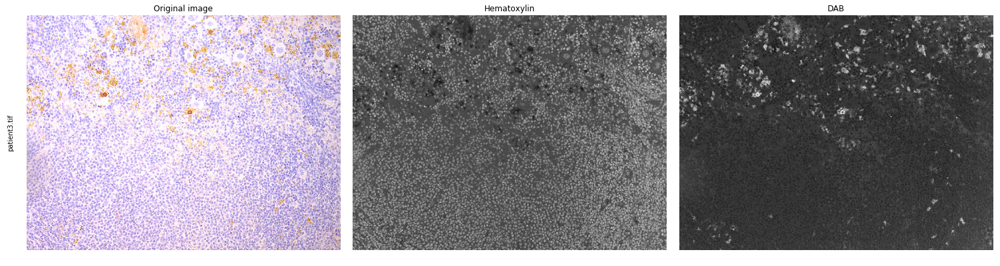

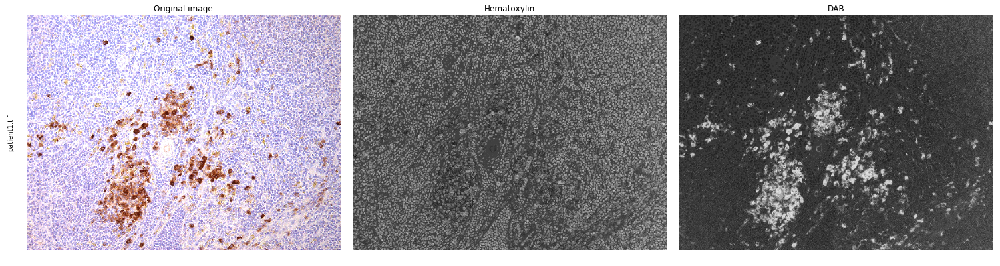

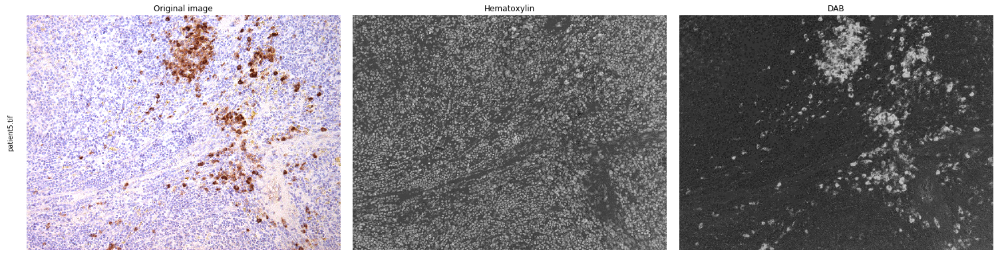

In [88]:
%matplotlib inline
import matplotlib.pyplot as plt
import os
from skimage import io
from skimage.color import rgb2hed

img_names = os.listdir('dataset')
for img_name in img_names:
    image = io.imread(os.path.join('dataset',img_name))
    ihc_hed = rgb2hed(image)
    fig, axes = plt.subplots(1, 3, figsize=(21, 18), sharex=True, sharey=True,subplot_kw={'adjustable': 'box-forced'})
    ax0, ax1, ax2 = axes.ravel()
    ax0.imshow(image)
    ax0.set_title("Original image")

    ax1.imshow(ihc_hed[:, :, 0], cmap=plt.cm.gray)
    ax1.set_title("Hematoxylin")

    ax2.imshow(ihc_hed[:, :, 2], cmap=plt.cm.gray)
    ax2.set_title("DAB")

    for ax in axes.ravel():
        ax.axis('off')

    fig.tight_layout()
    fig.text(0.01, 0.5, img_name, va='center', rotation='vertical')

For image processing, there is always variability in the data, due to technical aspects (tissue preparation, staining, image acquisition).
We will first see if samples were acquired with the same technical configurations

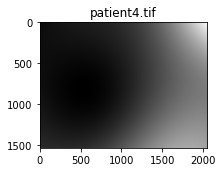

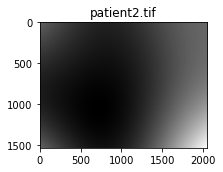

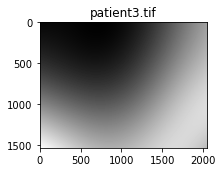

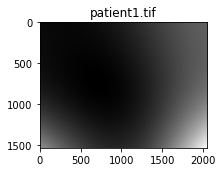

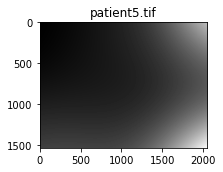

In [89]:
from skimage.exposure import rescale_intensity
from skimage.filters import gaussian
from skimage import exposure

for img_name in img_names:
    image = io.imread(os.path.join('dataset',img_name))
    ihc_hed = rgb2hed(image)
    ihc_hed_normed = rescale_intensity(ihc_hed[:, :, 0], out_range=(0, 1))
    background = gaussian(ihc_hed_normed, sigma=500)
    #ihc_hed_corrected = ihc_hed_normed - background
    #ihc_hed_corrected = rescale_intensity(ihc_hed_corrected, out_range=(0, 1))
    fig, ax = plt.subplots(1,figsize=(3, 3), sharex=True, sharey=True,subplot_kw={'adjustable': 'box-forced'})
    ax.imshow(background, cmap=plt.cm.gray)
    ax.set_title(img_name)
    plt.show()


Samples need to be individually corrected with their respective background

Let's try to detect nuclei after correction

In [156]:
img_name = img_names[3]

image = io.imread(os.path.join('dataset',img_name))
ihc_hed = rgb2hed(image)
ihc_hed_normed = rescale_intensity(ihc_hed[:, :, 0], out_range=(0, 1))
background = gaussian(ihc_hed_normed, sigma=500)
ihc_hed_corrected = ihc_hed_normed - background
ihc_hed_corrected = rescale_intensity(ihc_hed_corrected, out_range=(0, 1))

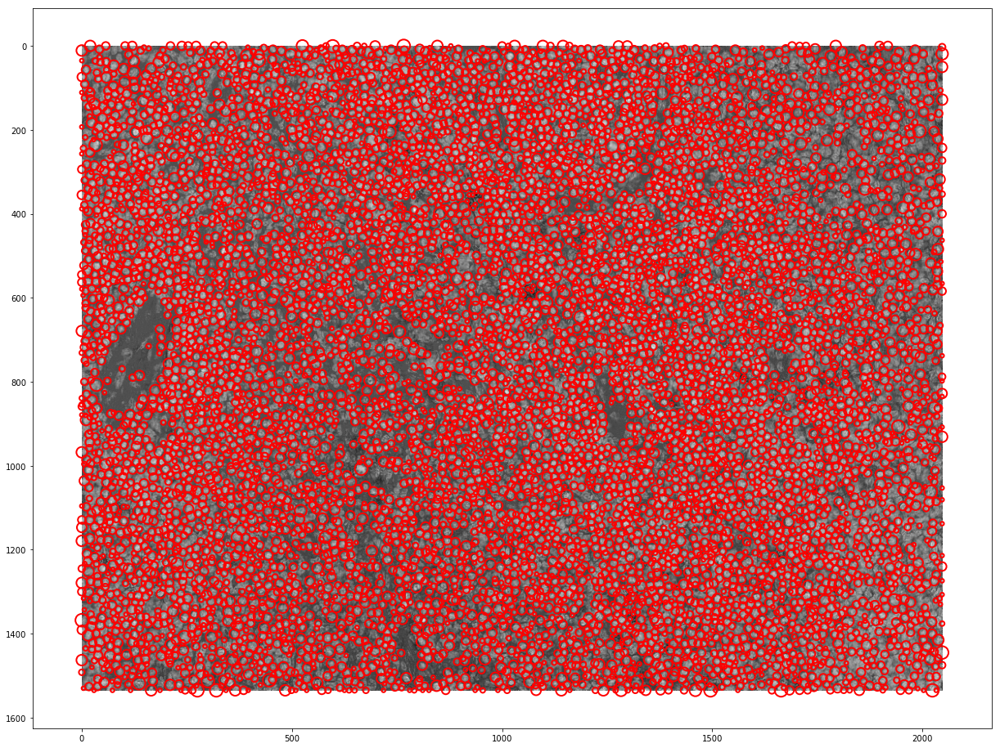

In [144]:
from skimage.feature import blob_log
import numpy as np
from math import sqrt

pixel_size = 0.3111 # this is the distance in micrometer for a single pixel
blobs_log = blob_log(ihc_hed_corrected, min_sigma= 6.0*pixel_size, max_sigma=20.0*pixel_size, num_sigma=10, threshold=.1)
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

y, x, r = np.split(blobs_log, 3, 1)
fig,ax = plt.subplots(1, figsize=(21, 18))

# Show the image
ax.imshow(ihc_hed_corrected, cmap=plt.cm.gray)
plt.scatter(x, y, 3.14*(r*r),linewidth=2,facecolors='none',edgecolors='r')

We have a lot of border effect, so we need to set a boundary limit for detection (2x size of the cells)

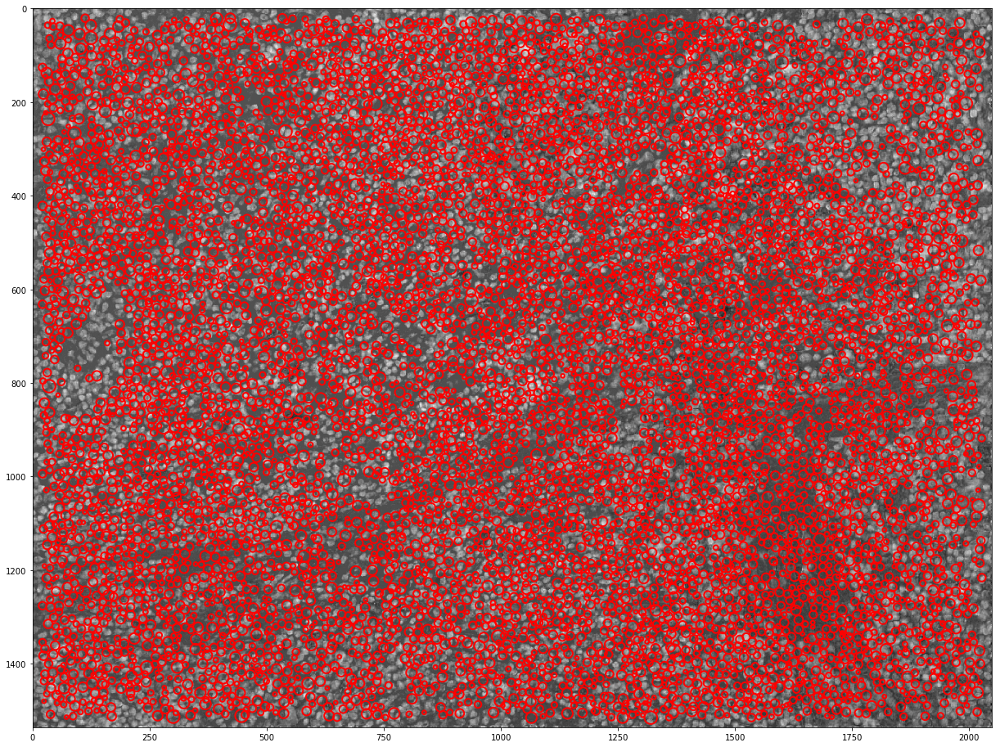

In [154]:
# Vertical filter
blobs_log_short = blobs_log[blobs_log[:,0]>20.0,:]
blobs_log_short = blobs_log_short[blobs_log_short[:,0]<ihc_hed_corrected.shape[0]-20.0,:]
# Horizontal filter
blobs_log_short = blobs_log_short[blobs_log_short[:,1]>20.0,:]
blobs_log_short = blobs_log_short[blobs_log_short[:,1]<ihc_hed_corrected.shape[1]-20.0,:]

y, x, r = np.split(blobs_log_short, 3, 1)
fig,ax = plt.subplots(1, figsize=(21, 18))

# Show the image
ax.imshow(ihc_hed_corrected, cmap=plt.cm.gray)
plt.scatter(x, y, 3.14*r*r,linewidth=2,facecolors='none',edgecolors='r')

In [125]:
blobs_log_short.shape[0]

5698

We have detect 7544 cells in this field of view.
Now we will use this approach to calculate the number of infiltrating T-cells

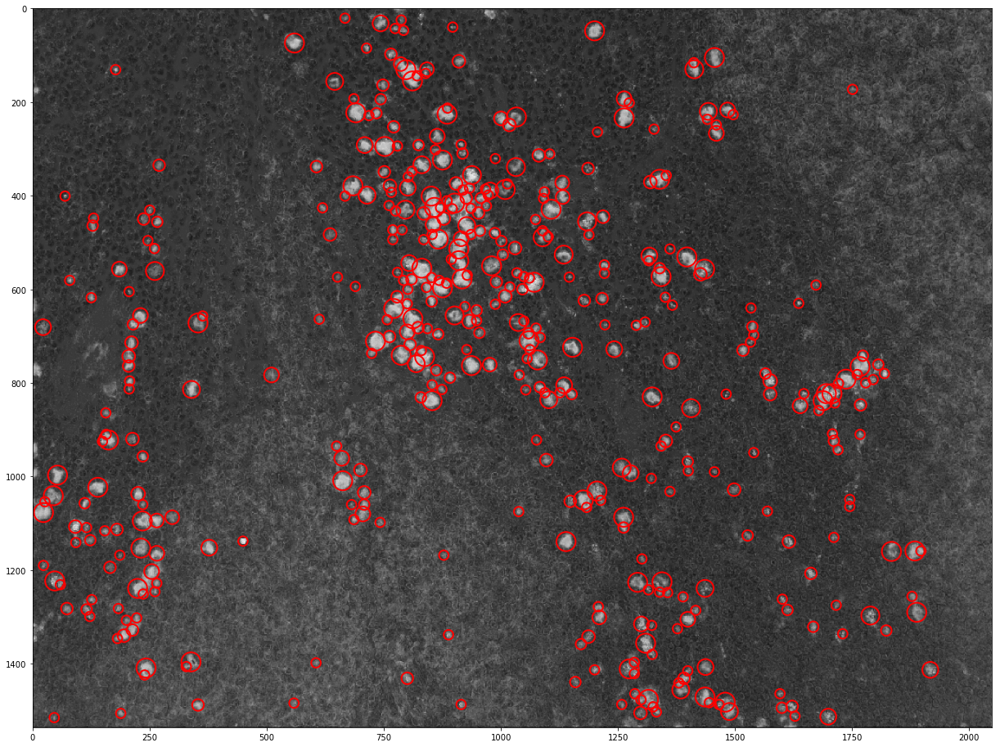

In [159]:
ihc_dab_normed = rescale_intensity(ihc_hed[:, :, 2], out_range=(0, 1))
ihc_dab_corrected = ihc_dab_normed - background
ihc_dab_corrected = rescale_intensity(ihc_dab_corrected, out_range=(0, 1))

blobs_log_dab = blob_log(ihc_dab_corrected, min_sigma= 15.0*pixel_size, max_sigma=30.0*pixel_size, num_sigma=10, 
                         threshold=.1)
blobs_log_dab[:, 2] = blobs_log_dab[:, 2] * sqrt(2)

# Vertical filter
blobs_log_dab_short = blobs_log_dab[blobs_log_dab[:,0]>20.0,:]
blobs_log_dab_short = blobs_log_dab_short[blobs_log_dab_short[:,0]<ihc_dab_corrected.shape[0]-20.0,:]
# Horizontal filter
blobs_log_dab_short = blobs_log_dab_short[blobs_log_dab_short[:,1]>20.0,:]
blobs_log_dab_short = blobs_log_dab_short[blobs_log_dab_short[:,1]<ihc_dab_corrected.shape[1]-20.0,:]

y, x, r = np.split(blobs_log_dab_short, 3, 1)
fig,ax = plt.subplots(1, figsize=(21, 18))

# Show the image
ax.imshow(ihc_dab_corrected, cmap=plt.cm.gray)
plt.scatter(x, y, 3.14*r*r,linewidth=2,facecolors='none',edgecolors='r')

In [127]:
blobs_log_dab_short.shape[0]

660

Get some statistic on cellular area and intensity in the region of interest (roi) to fine-tune detection

In [160]:
from skimage import data, util
from skimage.measure import label, regionprops
from skimage.draw import circle
intensities = np.zeros(blobs_log_dab_short.shape[0])
for i in range(blobs_log_dab_short.shape[0]):
    rr, cc = circle(blobs_log_dab_short[i,0],blobs_log_dab_short[i,1],int(blobs_log_dab_short[i,2]))
    img = np.zeros_like(ihc_dab_corrected, dtype=np.bool)
    img[rr, cc] = True
    val = ihc_dab_corrected.ravel()*img.ravel()
    intensities[i] = np.median(val[np.nonzero(val)])

Let's make an histogram of signal intensities in the DAB channel

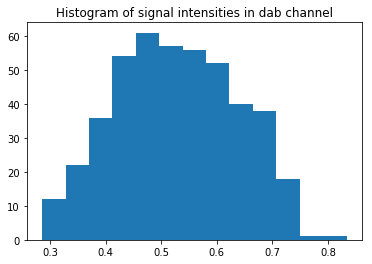

In [162]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.hist(intensities, bins='auto')
plt.title("Histogram of signal intensities in dab channel")
plt.show()

Now let's see the distribution of surface detected in the hematoxylin and the dab channel

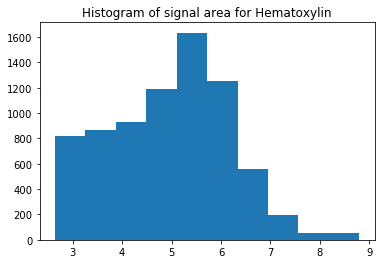

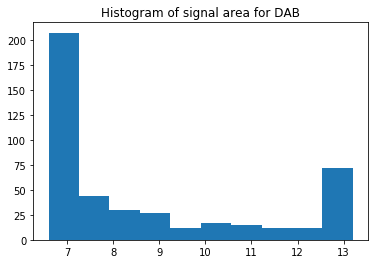

In [163]:
plt.hist(blobs_log_short[:,2], bins=10)
plt.title("Histogram of spots diameter for Hematoxylin")
plt.show()

plt.hist(blobs_log_dab_short[:,2], bins=10)
plt.title("Histogram of spots diameter area for DAB")
plt.show()

We can see that in the DAB channel, we detect several blob which are extremely small. This is due to the technical process of staining that produces precipitates artefacts (= small bright dots). We need to remove them by filtering.
Here we just select a threshold for surface.

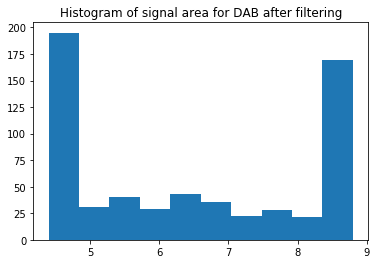

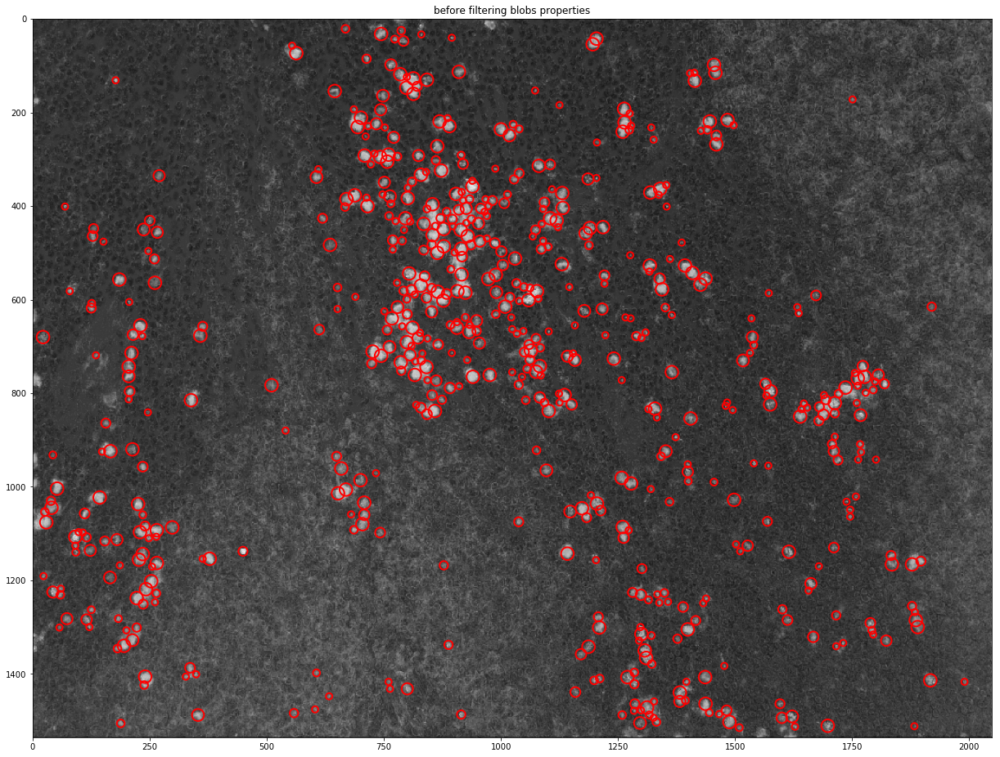

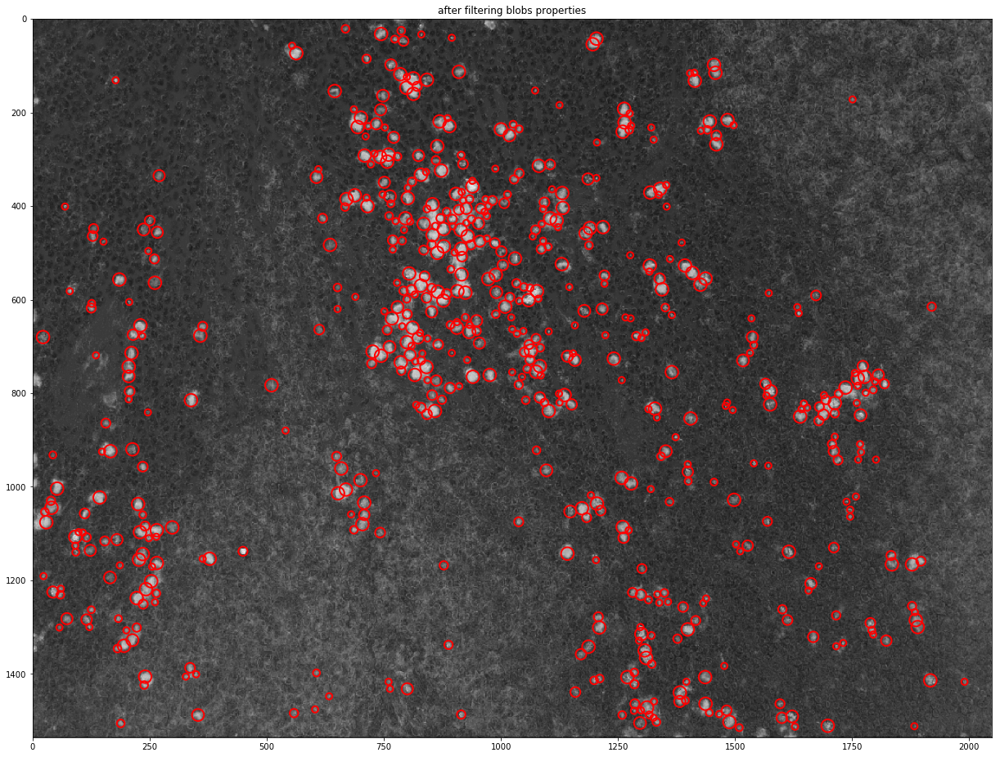

In [111]:
#filter what is above 3, probably signal artefacts (precipitate of the reagent)
filtered_dab_blobs = blobs_log_dab_short[blobs_log_dab_short[:,2]>3.0,:]
plt.hist(filtered_dab_blobs[:,2], bins=10)
plt.title("Histogram of signal area for DAB after filtering")
plt.show()

#Before filtering
y, x, r = np.split(blobs_log_dab_short, 3, 1)
fig,ax = plt.subplots(1, figsize=(21, 18))
ax.imshow(ihc_dab_corrected, cmap=plt.cm.gray)
plt.title('before filtering spots properties')
plt.scatter(x, y, 3.14*r*r,linewidth=2,facecolors='none',edgecolors='r')

#After filtering
y, x, r = np.split(filtered_dab_blobs, 3, 1)
fig,ax = plt.subplots(1, figsize=(21, 18))
ax.imshow(ihc_dab_corrected, cmap=plt.cm.gray)
plt.title('after filtering spots properties')
plt.scatter(x, y, 3.14*r*r,linewidth=2,facecolors='none',edgecolors='r')

In [112]:
filtered_dab_blobs.shape[0]

614

Now we will re-run the whole pipeline, with and without any corrections and compare diagnostic results in patients

In [164]:
# We reload all libraries as if we are starting again from here
import matplotlib.pyplot as plt
import os
from skimage import io
from skimage.color import rgb2hed
from skimage.feature import blob_log
import numpy as np
from math import sqrt
from skimage import data, util
from skimage.measure import label, regionprops
from skimage.draw import circle

img_names = os.listdir('dataset')
img_names.sort()

number_nuclei_without_cr = np.zeros(len(img_names))
number_nuclei_with_cr = np.zeros(len(img_names))
number_tcells_without_cr = np.zeros(len(img_names))
number_tcells_with_cr = np.zeros(len(img_names))

def blob_detection(img,channel='hed'):
    pixel_size = 0.3111 # this is the distance in micrometer for a single pixel
    if 'hed' in channel:
        # Nuclei are smaller than cell perimeter
        blobs_log = blob_log(img, min_sigma= 10.0*pixel_size, max_sigma=25.0*pixel_size, num_sigma=10, threshold=.1, overlap=.1)
    if 'dab' in channel:
        # Cell perimeter are bigger than nuclei
        blobs_log = blob_log(img, min_sigma= 15.0*pixel_size, max_sigma=30.0*pixel_size, num_sigma=10, threshold=.1)
    # remove blobs at border
    blobs_log_short = blobs_log[blobs_log[:,0]>20.0,:]
    blobs_log_short = blobs_log_short[blobs_log_short[:,0]<img.shape[0]-20.0,:]
    blobs_log_short = blobs_log_short[blobs_log_short[:,1]>20.0,:]
    blobs_log_short = blobs_log_short[blobs_log_short[:,1]<img.shape[1]-20.0,:]
    # adjust for diameter blobs
    blobs_log_short[:, 2] = blobs_log_short[:, 2] * sqrt(2)
    return blobs_log_short

for i in range(len(img_names)):
    image = io.imread(os.path.join('dataset',img_names[i]))
    ihc_hed = rgb2hed(image)
    
    # Process Hematoxylin channel
    ihc_hed_normed = rescale_intensity(ihc_hed[:, :, 0], out_range=(0, 1))
    background = gaussian(ihc_hed_normed, sigma=500)
    ihc_hed_corrected = ihc_hed_normed - background
    ihc_hed_corrected = rescale_intensity(ihc_hed_corrected, out_range=(0, 1))
    
    # Process DAB channel
    ihc_dab_normed = rescale_intensity(ihc_hed[:, :, 2], out_range=(0, 1))
    ihc_dab_corrected = ihc_dab_normed - background
    ihc_dab_corrected = rescale_intensity(ihc_dab_corrected, out_range=(0, 1))
    
    blob_hed_without_cr = blob_detection(ihc_hed_normed,'hed')
    blob_hed_with_cr = blob_detection(ihc_hed_corrected,'hed')
    blob_dab_without_cr = blob_detection(ihc_dab_normed,'dab')
    blob_dab_with_cr = blob_detection(ihc_dab_corrected,'dab')
    
    # Filter DAB Blobs that are artefacts (area and intensities)
    blob_dab_with_cr = blob_dab_with_cr[blob_dab_with_cr[:,2]>4.0,:]
    intensities = np.zeros(blob_dab_with_cr.shape[0])
    for j in range(blob_dab_with_cr.shape[0]):
        rr, cc = circle(blob_dab_with_cr[j,0],blob_dab_with_cr[j,1],int(blob_dab_with_cr[j,2]))
        img = np.zeros_like(ihc_dab_corrected, dtype=np.bool)
        img[rr, cc] = True
        val = ihc_dab_corrected.ravel()*img.ravel()
        intensities[j] = np.median(val[np.nonzero(val)])
    blob_dab_with_cr = blob_dab_with_cr[intensities>0.6,:]
    
    # Save results
    number_nuclei_without_cr[i] = blob_hed_without_cr.shape[0]
    number_nuclei_with_cr[i] = blob_hed_with_cr.shape[0]
    number_tcells_without_cr[i] = blob_dab_without_cr.shape[0]
    number_tcells_with_cr[i] = blob_dab_with_cr.shape[0]
    